<center><img src='./Figs/cs-logo.png' width=200></center>



<h6><center></center></h6>

<h1>
<hr style=" border:none; height:3px;">
<center> Mention IA - CentraleSupélec - VISORD  </center>
<h3><center>Student: EL BARHICHI Mohammed</center></h3>
<hr style=" border:none; height:3px;">
</h1>

# Detection de panneaux routiers dans des images

L'objectif de cette partie est de mettre en place une chaine de traitement pour extraire les pièces des images du repertoire [Signs](./data/signs/).

Cette partie est laissée volontairement libre. Vous détaillerez et justifierez la mise en place de votre approche.

## 1. Data Inspection and Analysis

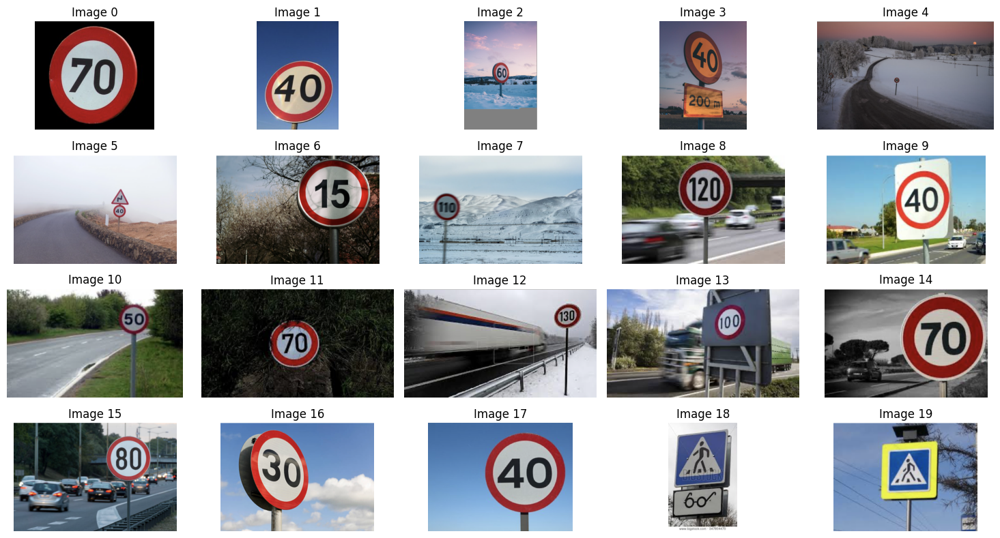

In [2]:
from skimage import io
import matplotlib.pyplot as plt
import os

image_dir = "./Signs"
image_files = sorted([f for f in os.listdir(image_dir) if f.endswith('.png')])
images = [io.imread(os.path.join(image_dir, fname)) for fname in image_files]


plt.figure(figsize=(15, 8))
for idx, img in enumerate(images):
    plt.subplot(4, 5, idx + 1)
    plt.imshow(img)
    plt.title(f"Image {idx}")
    plt.axis('off')
plt.tight_layout()
plt.show()


We can see that the folder includes:

- Speed limit signs (e.g. 15, 30, 40, 70, 120, 130, etc.)

- Different lighting/blur conditions

- Signs at different distances and scales

- A few non-circular signs (e.g., pedestrian crossing)

## 2. Preprocessing 

In [ ]:
from skimage.color import rgb2hsv
import numpy as np

def extract_red_regions(image):
    """Convert image to HSV and extract red-colored regions."""
    if image.shape[-1] == 4:
        image = image[..., :3]
    hsv = rgb2hsv(image)

    # Red wraps around 0 in HSV: we define two ranges
    lower_red1 = (0.0, 0.4, 0.2)
    upper_red1 = (0.05, 1.0, 1.0)
    lower_red2 = (0.9, 0.4, 0.2)
    upper_red2 = (1.0, 1.0, 1.0)

    mask1 = ((hsv[..., 0] >= lower_red1[0]) & (hsv[..., 0] <= upper_red1[0]) &
             (hsv[..., 1] >= lower_red1[1]) & (hsv[..., 2] >= lower_red1[2]))
    mask2 = ((hsv[..., 0] >= lower_red2[0]) & (hsv[..., 0] <= upper_red2[0]) &
             (hsv[..., 1] >= lower_red2[1]) & (hsv[..., 2] >= lower_red2[2]))

    return mask1 | mask2


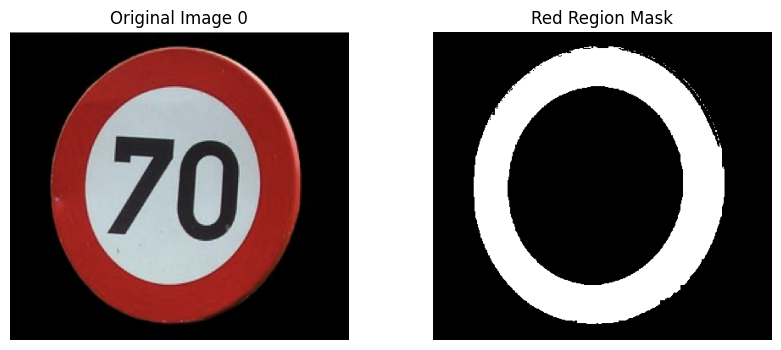

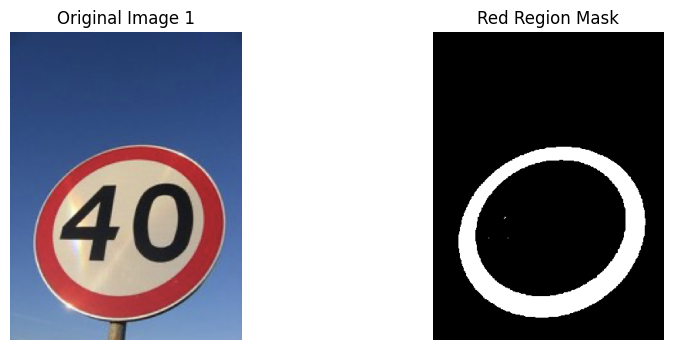

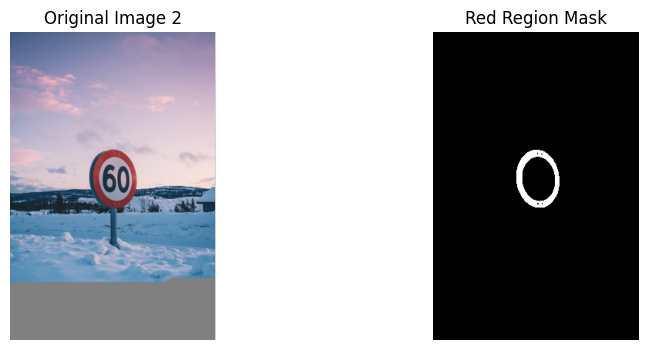

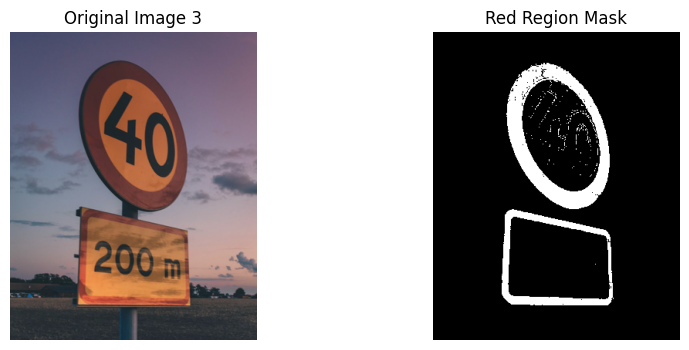

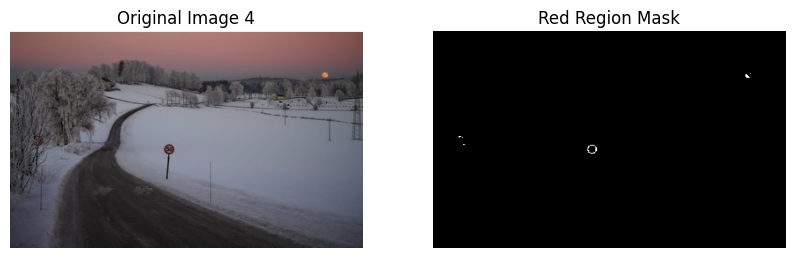

...

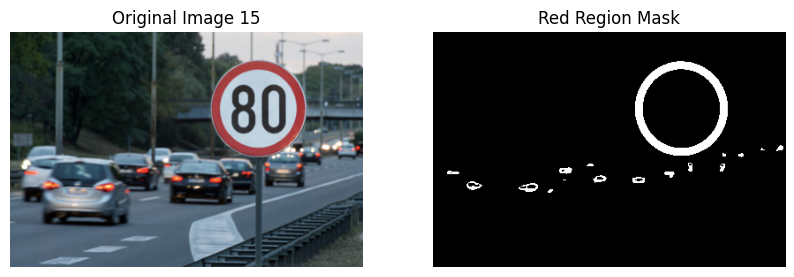

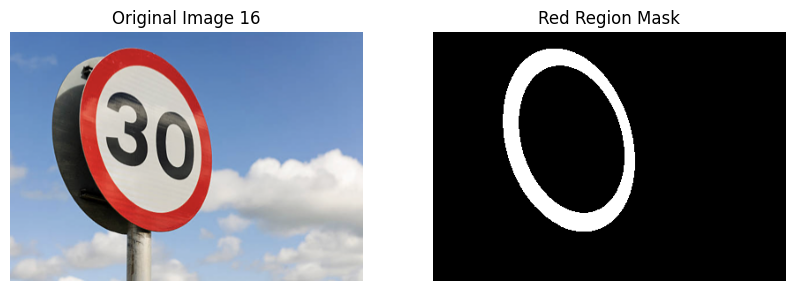

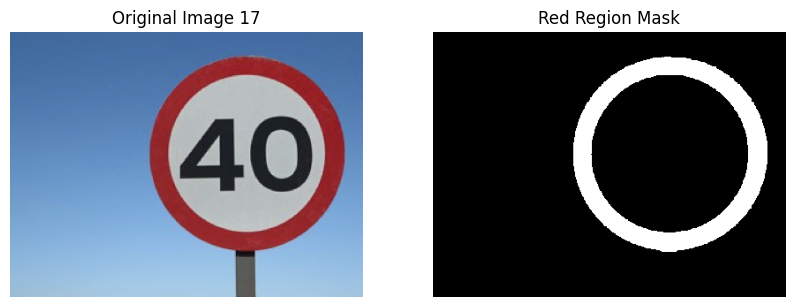

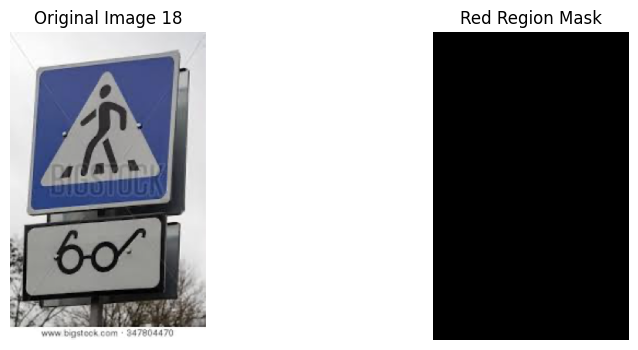

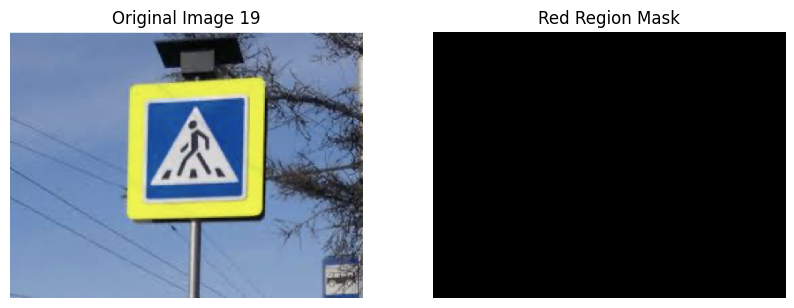

In [ ]:
# Visualize red mask on images
selected_indices = range(len(images)) 
for idx in selected_indices:
    image = images[idx]
    mask = extract_red_regions(image)

    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title(f"Original Image {idx}")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(mask, cmap='gray')
    plt.title("Red Region Mask")
    plt.axis("off")

    plt.show()


Dans cette étape, nous avons converti chaque image dans l’espace colorimétrique **HSV** afin d’extraire les régions contenant des **tons de rouge**, qui sont caractéristiques des bords des panneaux routiers (comme les limitations de vitesse).

Nous avons utilisé deux intervalles de teintes HSV pour couvrir l’ensemble du spectre rouge (en début et fin du cercle chromatique), ce qui permet de détecter efficacement les contours rouges quelle que soit leur nuance.

#### Résultats observés :
- La segmentation a très bien fonctionné pour la majorité des images contenant des **panneaux à bord rouge** : les masques générés mettent en évidence les zones pertinentes.
- Cependant, certaines images contiennent **d'autres éléments rouges** (par exemple, objets dans le décor ou pictogrammes), ce qui génère des **faux positifs** que nous devrons filtrer dans l'étape suivante.
- Pour les **deux dernières images**, les panneaux étaient **à dominante bleue** : la méthode actuelle, basée uniquement sur le rouge, **ne permet pas de les détecter**. Cela met en évidence une limite importante si l’on souhaite détecter des panneaux de types variés.

Cette étape de prétraitement constitue néanmoins une bonne base pour la **proposition de régions candidates**, que nous allons filtrer par la suite à l’aide d’analyses de formes et de taille.


## 3. Candidate Region Detection via Morphology and Shape Filtering

In [ ]:
from skimage.measure import regionprops, label
from skimage.morphology import closing, square
import matplotlib.patches as patches

def detect_candidate_regions(image, mask, min_area=500, max_aspect_ratio=2, show_debug=False):
    """
    Détecte les zones candidates à partir d'un masque binaire.
    Filtre les régions selon leur taille et leur forme.
    """
    cleaned = closing(mask, square(3))  
    labeled = label(cleaned)
    regions = regionprops(labeled)
    candidates = []

    for region in regions:
        if region.area < min_area:
            continue
        minr, minc, maxr, maxc = region.bbox
        width = maxc - minc
        height = maxr - minr
        aspect_ratio = max(width / height, height / width)
        if aspect_ratio > max_aspect_ratio:
            continue
        candidates.append((minr, minc, maxr, maxc))

    # Visualisation
    if show_debug:
        fig, ax = plt.subplots(1, figsize=(8, 6))
        if image.shape[-1] == 4:
            image = image[..., :3]
        ax.imshow(image)
        for (minr, minc, maxr, maxc) in candidates:
            rect = patches.Rectangle((minc, minr), maxc - minc, maxr - minr,
                                     edgecolor='lime', facecolor='none', linewidth=2)
            ax.add_patch(rect)
        ax.set_title(f"Régions candidates détectées : {len(candidates)}")
        ax.axis("off")
        plt.show()

    return candidates


C:\Users\moham\AppData\Local\Temp\ipykernel_7824\3178002514.py:10: FutureWarning: `square` is deprecated since version 0.25 and will be removed in version 0.27. Use `skimage.morphology.footprint_rectangle` instead.
  cleaned = closing(mask, square(3))


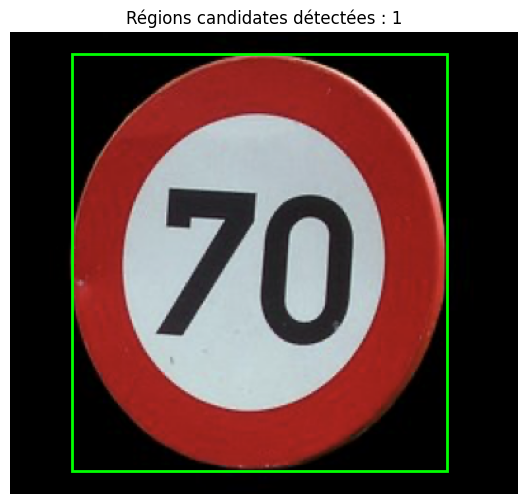

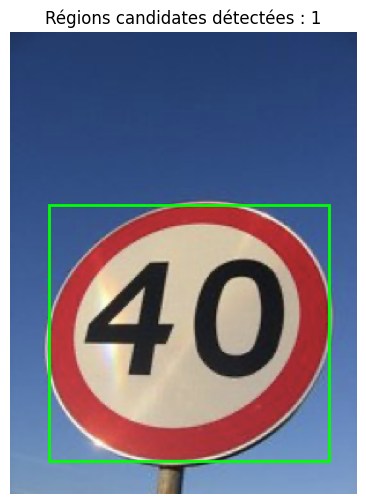

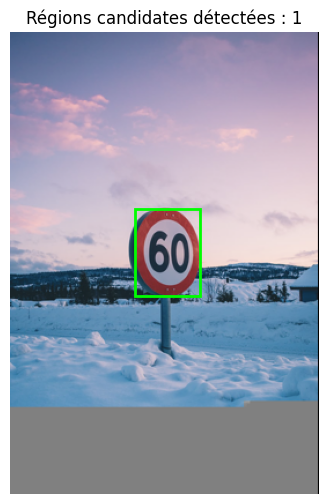

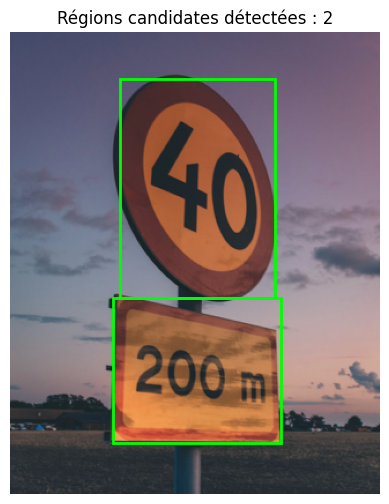

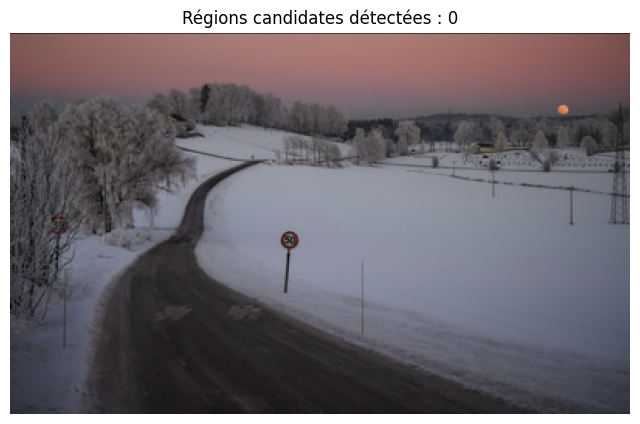

...

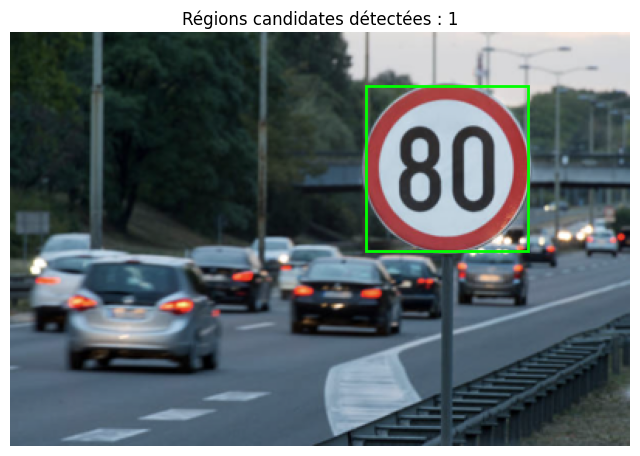

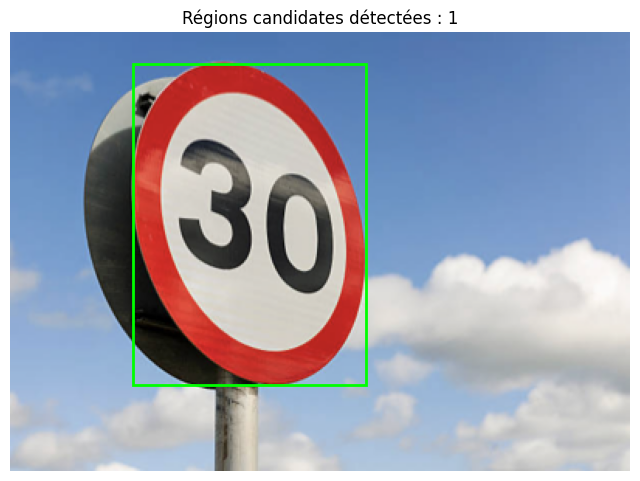

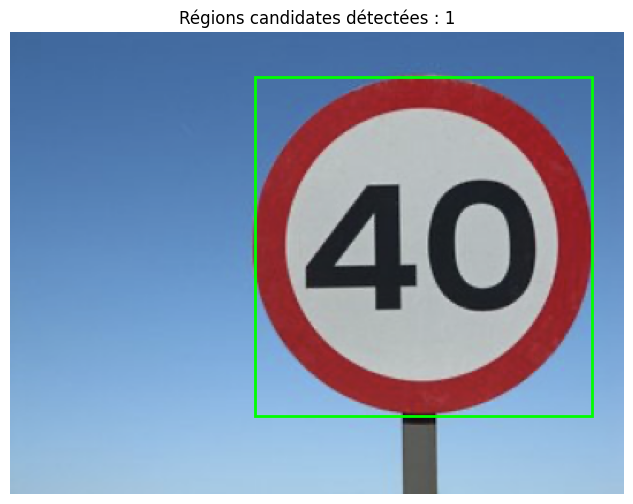

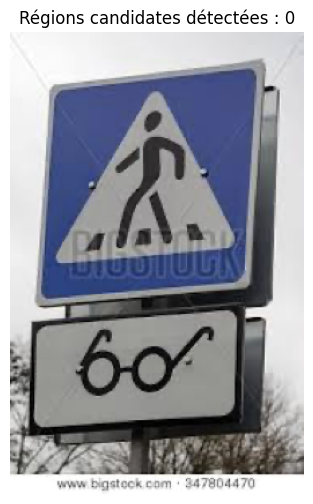

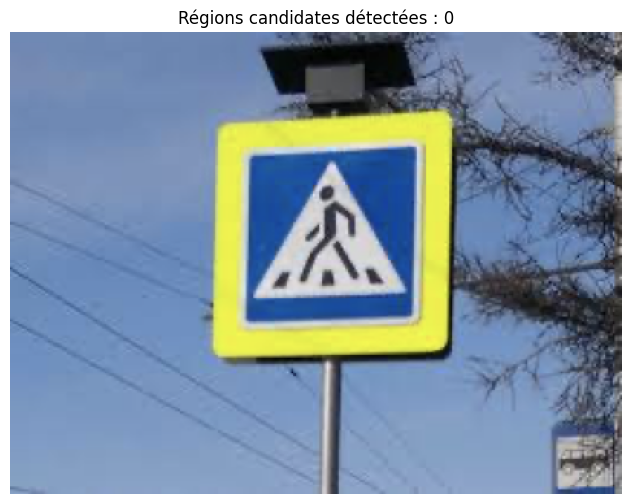

In [ ]:
test_indices = range(0, len(images)) 
for idx in test_indices:
    img = images[idx]
    mask = extract_red_regions(img)
    detect_candidate_regions(img, mask, show_debug=True)


Après avoir appliqué la détection de régions candidates sur l’ensemble des images, nous avons identifié trois types de cas problématiques fréquents :

#### 1. Panneaux rouges très éloignés
Même lorsque le **masque rouge HSV** détecte correctement un panneau, celui-ci peut être **trop petit ou trop distant** pour satisfaire les critères de surface minimale (`min_area`). Il est alors **filtré à tort** par l’algorithme de sélection.

**Solution possible** : diminuer la valeur de `min_area`, ou mieux encore, **appliquer une pyramide d’images** (multi-scale detection) pour détecter les objets à différentes tailles.



#### 2. Panneaux à fond bleu
Certains panneaux (ex. : piétons, avertissements) sont de **couleur bleue** et **n'apparaissent pas du tout dans le masque rouge**. Ces panneaux sont donc **ignorés totalement** par l’algorithme.

**Solution possible** : ajouter un **deuxième masque HSV** pour détecter la couleur bleue (Hue entre ~0.55 et 0.70), et combiner les deux masques.



#### 3. Faux positifs : objets rouges non pertinents
Des objets rouges présents dans l’environnement (branches, panneaux décoratifs, etc.) sont **détectés à tort** comme régions candidates alors qu’ils ne sont pas des panneaux.

**Solution possible** :
- Ajouter un **filtre sur la forme** (circularité, compacité),
- Ou passer à une étape de **classification supervisée** : HOG + SVM ou modèle de deep learning léger (CNN).


## 4. Color-Based Enhancement with Red and Blue Mask Fusion

In [19]:
def extract_red_with_fallback_blue(image):
    """
    Extract red regions from an image, and if none are found, fallback to blue.
    """
    if image.shape[-1] == 4:
        image = image[..., :3]
    hsv = rgb2hsv(image)

    # Rouge : deux plages de teintes
    lower_red1 = (0.0, 0.4, 0.2)
    upper_red1 = (0.05, 1.0, 1.0)
    lower_red2 = (0.9, 0.4, 0.2)
    upper_red2 = (1.0, 1.0, 1.0)

    mask_red1 = ((hsv[..., 0] >= lower_red1[0]) & (hsv[..., 0] <= upper_red1[0]) &
                 (hsv[..., 1] >= lower_red1[1]) & (hsv[..., 2] >= lower_red1[2]))
    mask_red2 = ((hsv[..., 0] >= lower_red2[0]) & (hsv[..., 0] <= upper_red2[0]) &
                 (hsv[..., 1] >= lower_red2[1]) & (hsv[..., 2] >= lower_red2[2]))

    mask_red = mask_red1 | mask_red2

    # Si le masque rouge est vide, fallback vers le bleu
    if np.sum(mask_red) == 0:
        lower_blue = (0.55, 0.4, 0.2)
        upper_blue = (0.70, 1.0, 1.0)
        mask_blue = ((hsv[..., 0] >= lower_blue[0]) & (hsv[..., 0] <= upper_blue[0]) &
                     (hsv[..., 1] >= lower_blue[1]) & (hsv[..., 2] >= lower_blue[2]))
        return mask_blue

    return mask_red


C:\Users\moham\AppData\Local\Temp\ipykernel_7824\3178002514.py:10: FutureWarning: `square` is deprecated since version 0.25 and will be removed in version 0.27. Use `skimage.morphology.footprint_rectangle` instead.
  cleaned = closing(mask, square(3))


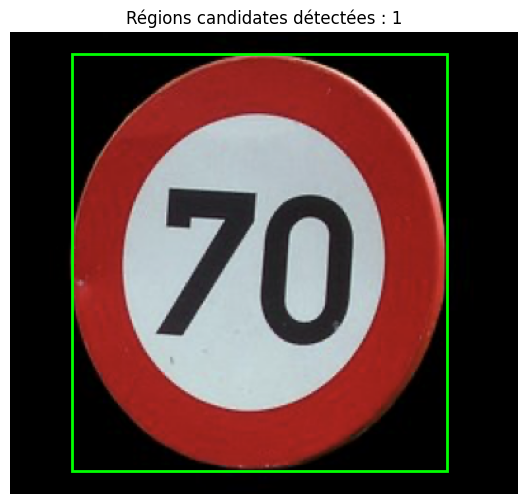

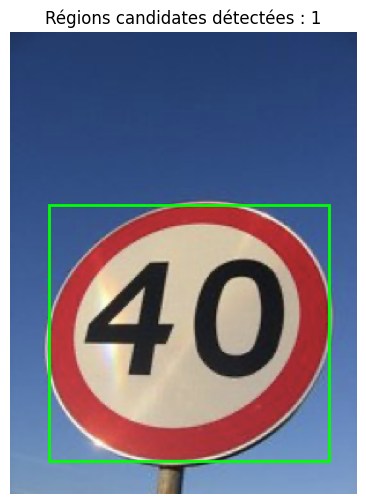

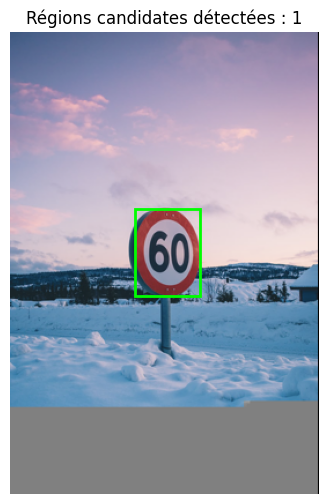

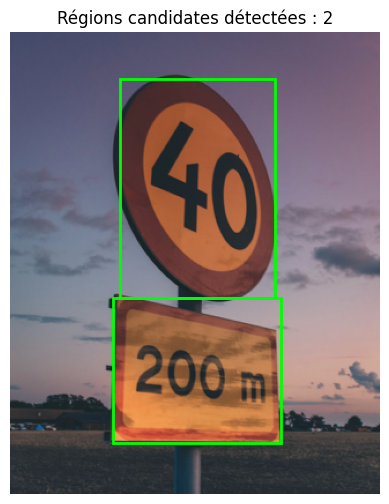

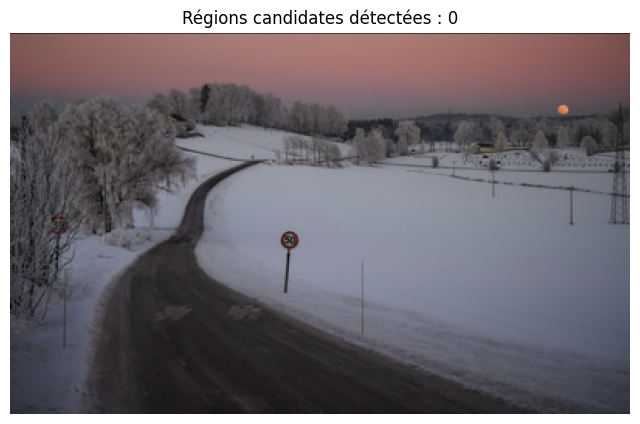

...

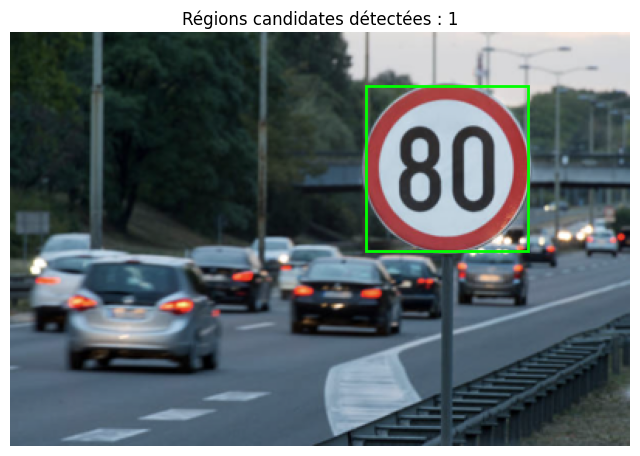

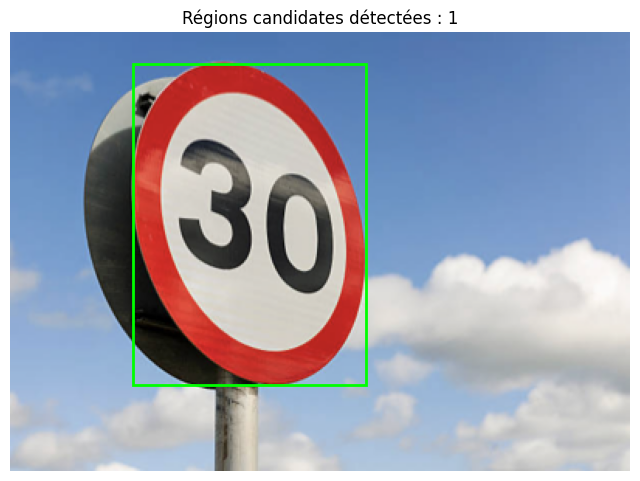

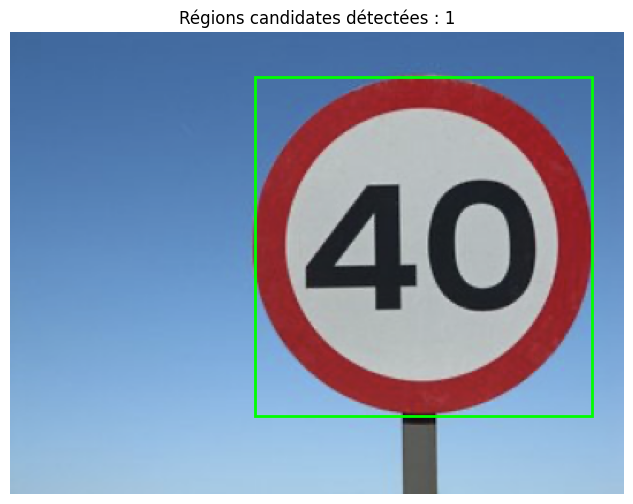

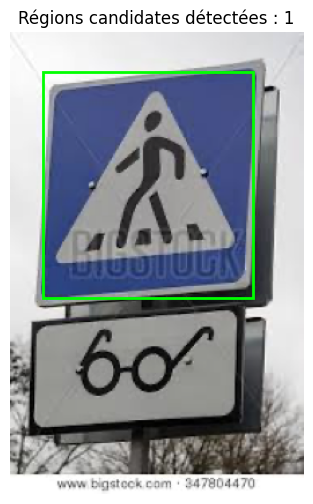

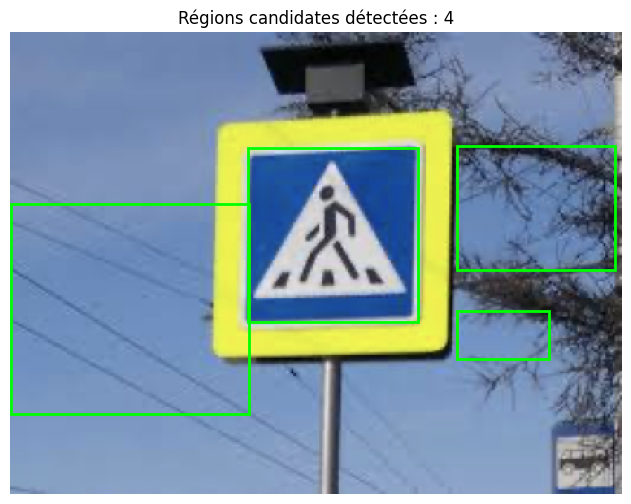

In [27]:
# Test on images including blue signs
test_indices = range(len(images))  # Panneaux bleus + mixtes
for idx in test_indices:
    image = images[idx]
    mask = extract_red_with_fallback_blue(image)
    detect_candidate_regions(image, mask, min_area=600,show_debug=True)


Afin d'améliorer la détection des panneaux **à fond bleu** tout en évitant les faux positifs, nous avons mis en œuvre une approche conditionnelle :

- Nous détectons **d’abord les régions rouges** (panneaux classiques).
- **Si aucune région rouge n’est trouvée**, nous basculons automatiquement vers un **masque bleu**.
- Ce mécanisme permet de garder une **logique prioritaire** : les panneaux sont généralement rouges, mais certains peuvent être bleus.

#### Réglage supplémentaire :
Nous avons également testé plusieurs valeurs pour le paramètre `min_area`. Une valeur plus élevée (ex : `600`) a permis de **réduire les fausses détections** sur des éléments rouges ou bleus non pertinents (reflets, décor...).


### Résultats obtenus :
- Les **panneaux rouges** sont bien détectés sauf pour les cas **très éloignés** (zone trop petite, filtrée par `min_area`).
- Les **panneaux bleus** sont désormais bien captés grâce au fallback.
- Toutefois, **dans certains cas**, plusieurs zones candidates sont détectées, notamment lorsque :
  - Le **ciel bleu** a des couleurs proches du panneau → génère plusieurs faux positifs,
  - Le **panneau est très petit** ou éloigné → rejeté à cause du `min_area`.


### Pistes d’amélioration :
1. **Utiliser une pyramide d’images** (multi-échelle) pour détecter les **petits panneaux** sans baisser `min_area`.
2. Ajouter un **filtre de forme (circularité, compacité)** pour éliminer les zones "bizarres" qui ne ressemblent pas à des panneaux.

Ces améliorations permettront d’augmenter la précision du système sans trop de faux positifs.


## 5. Geometric Filtering Based on Shape Properties

Dans cette étape, nous nous concentrons sur une image spécifique qui a produit plusieurs régions candidates — celle contenant un **panneau de signalisation bleu triangulaire** (Image 19).

Comme le filtrage par couleur retourne plusieurs régions, nous cherchons maintenant à **affiner la sélection** en analysant la **forme géométrique** de chaque candidat. En particulier, nous nous attendons à ce que la bonne région présente un **triangle blanc au centre**, contrairement aux autres régions rectangulaires ou irrégulières de l’image.

Pour cela, nous allons :
- Convertir chaque région candidate en niveaux de gris puis la binariser,
- Extraire les contours et approximer leur forme polygonale,
- Conserver uniquement les candidats qui ressemblent à un **triangle**, c’est-à-dire avec 3 à 5 sommets caractéristiques.

Cette approche permet de **réduire les faux positifs** et de privilégier les candidats qui ont réellement la forme attendue, au-delà de la simple information de couleur.

In [ ]:
from skimage.color import rgb2gray
from skimage.filters import threshold_otsu
from skimage.measure import find_contours, approximate_polygon
def keep_triangular_candidates(image, candidates, show=True):
    """
    Garde uniquement les régions candidates ayant une forme proche d'un triangle.
    """
    good_candidates = []

    for (minr, minc, maxr, maxc) in candidates:
        patch = image[minr:maxr, minc:maxc]

        if patch.ndim == 3 and patch.shape[-1] == 4:
            patch = patch[..., :3]

        # Convertir en niveaux de gris
        if patch.ndim == 3:
            gray_patch = rgb2gray(patch)
        else:
            gray_patch = patch 

        # Binarisation et contours
        thresh = threshold_otsu(gray_patch)
        binary_patch = gray_patch < thresh
        contours = find_contours(binary_patch, 0.8)

        if not contours:
            continue

        main_contour = max(contours, key=lambda c: len(c))
        approx = approximate_polygon(main_contour, tolerance=5.0)

        if 3 < len(approx) <= 5:
            good_candidates.append((minr, minc, maxr, maxc))

            if show:
                fig, ax = plt.subplots()
                ax.imshow(patch)
                ax.set_title(f"Shape with {len(approx)} corners")
                ax.axis("off")
                plt.show()
        

    return good_candidates


C:\Users\moham\AppData\Local\Temp\ipykernel_7824\3178002514.py:10: FutureWarning: `square` is deprecated since version 0.25 and will be removed in version 0.27. Use `skimage.morphology.footprint_rectangle` instead.
  cleaned = closing(mask, square(3))


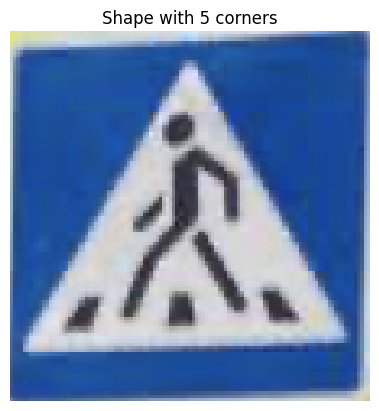

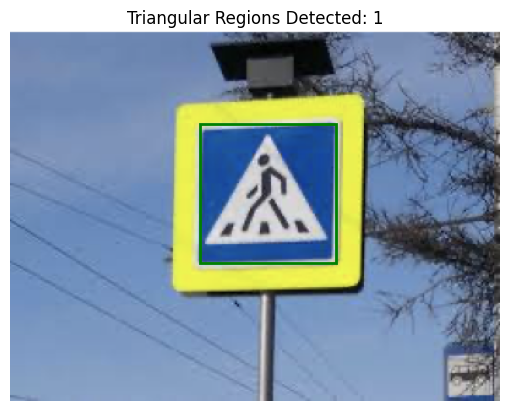

In [37]:
idx = 19
img = images[idx]
mask = extract_red_with_fallback_blue(img)
candidates = detect_candidate_regions(img, mask, show_debug=False)

triangular_candidates = keep_triangular_candidates(img, candidates, show=True)

# Visualiser dans l'image
fig, ax = plt.subplots()
ax.imshow(img)
for (minr, minc, maxr, maxc) in triangular_candidates:
    rect = patches.Rectangle((minc, minr), maxc - minc, maxr - minr,
                             edgecolor='green', facecolor='none', linewidth=2)
    ax.add_patch(rect)
ax.set_title(f"Triangular Regions Detected: {len(triangular_candidates)}")
plt.axis("off")
plt.show()


L'approche basée sur la forme géométrique des candidats a bien fonctionné.  
Elle nous a permis de **filtrer efficacement** les régions qui ne correspondent pas à la forme attendue du panneau — notamment en éliminant les **zones rectangulaires** et en conservant uniquement celles ayant une **forme triangulaire**.

Grâce à cette étape, nous disposons désormais d’un code robuste capable de :
- **Détecter correctement tous les panneaux rouges et bleus**,  
- **Filtrer les faux positifs** basés uniquement sur la couleur,  
- Et **gérer les cas multi-candidats** en conservant le plus pertinent.

#### Limite restante

Il reste un seul cas qui pose problème :  
 **L’image 4**, où le panneau est bien rouge, mais **très éloigné de la caméra**.  
Il est détecté dans le masque couleur, mais ensuite **rejeté car trop petit** lors du filtrage par aire (`min_area`).

#### Piste d'amélioration

Pour traiter ce cas, on pourrait appliquer une **pyramide d’images (multi-échelles)** sur les images qui ne retournent aucune région valide, afin de **zoomer artificiellement** sur les petits panneaux et les détecter.

Cette amélioration permettrait de couvrir le dernier cas limite tout en conservant les bonnes performances globales du système.


## 6. Final Recovery Step Using Image Pyramid for Missed Detections


Afin de compléter notre pipeline de détection, nous ajoutons ici un **traitement final spécifique** destiné aux images pour lesquelles **aucun panneau n’a été détecté** lors de l'étape classique de filtrage.

Cette étape complémentaire ne s'applique **que dans ces cas particuliers**.  
Elle consiste à utiliser une **pyramide d’images** (image pyramid), c’est-à-dire à **zoomer artificiellement** sur l’image pour permettre la détection de **panneaux trop petits ou trop éloignés**, qui avaient été ignorés par les filtres précédents (notamment à cause du `min_area`).

Ce traitement a été appliqué avec succès sur l’image 4, permettant de récupérer le panneau manquant.


In [43]:
from skimage.transform import rescale

def generate_image_pyramid(image, scale_factors=[1.5, 2, 2.5, 3]):
    """
    Génère plusieurs versions de l'image à différentes échelles (zoom).
    """
    pyramids = []
    for scale in scale_factors:
        scaled_image = rescale(image, scale, channel_axis=-1, anti_aliasing=True)
        pyramids.append((scale, scaled_image))
    return pyramids


Testing at scale 1.5


C:\Users\moham\AppData\Local\Temp\ipykernel_7824\3178002514.py:10: FutureWarning: `square` is deprecated since version 0.25 and will be removed in version 0.27. Use `skimage.morphology.footprint_rectangle` instead.
  cleaned = closing(mask, square(3))


No candidates detected at this scale.

Testing at scale 2
No candidates detected at this scale.

Testing at scale 2.5
Detected 1 candidate(s) at scale 2.5


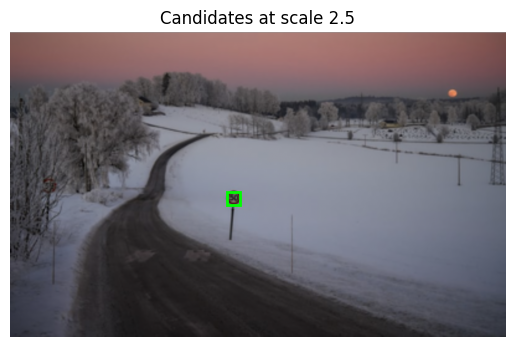

In [46]:
idx = 4
original_img = images[idx]

# Génère les versions zoomées
pyramids = generate_image_pyramid(original_img)

# Parcours les images zoomées
for scale, scaled_img in pyramids:
    print(f"Testing at scale {scale}")
    
    mask = extract_red_with_fallback_blue(scaled_img)
    candidates = detect_candidate_regions(scaled_img, mask, min_area=200, show_debug=False)

    if len(candidates) > 0:
        print(f"Detected {len(candidates)} candidate(s) at scale {scale}")

        # Affichage
        fig, ax = plt.subplots()
        ax.imshow(scaled_img)
        for (minr, minc, maxr, maxc) in candidates:
            rect = patches.Rectangle((minc, minr), maxc - minc, maxr - minr,
                                     edgecolor='lime', facecolor='none', linewidth=2)
            ax.add_patch(rect)
        ax.set_title(f"Candidates at scale {scale}")
        plt.axis("off")
        plt.show()

        break  # Stop dès qu'on trouve une bonne détection
    else:
        print("No candidates detected at this scale.\n")


En appliquant la stratégie de pyramide d’images sur l’image 4 — un cas problématique où le panneau était trop petit et éloigné — nous avons pu **détecter avec succès la région contenant le panneau**.

C’est particulièrement à l’**échelle 2.5** que la région candidate est devenue suffisamment grande pour passer les filtres (notamment `min_area`) et être identifiée correctement.

Ce résultat confirme l’intérêt d’utiliser une **analyse multi-échelle uniquement en cas d’échec** de la méthode classique. Cela permet d'améliorer la robustesse globale de notre pipeline sans introduire de surtraitement sur les autres images.


## 7. Final conclusion

Nous avons mis en œuvre un pipeline complet pour la **détection automatique de panneaux de signalisation** dans des images naturelles.  

Ce pipeline est conçu pour être **robuste**, **modulaire** et **adapté à des cas variés**, grâce aux étapes suivantes :

1. **Inspection visuelle** initiale pour comprendre les types de panneaux et les variations de contexte.
2. **Prétraitement couleur** basé sur l’espace HSV pour détecter :
   - les **zones rouges** dans un premier temps,
   - et les **zones bleues** uniquement si aucune rouge n’est détectée.
3. **Détection de régions candidates** à partir du masque binaire obtenu, avec des filtres sur :
   - la **surface minimale** (`min_area`),
   - et éventuellement le **rapport largeur/hauteur**.
4. **Filtrage géométrique** des régions par **analyse de forme**, permettant d’éliminer les faux positifs sur base de :
   - leur **contour**,
   - et leur **proximité à une forme triangulaire**.
5. **Post-traitement par pyramide d’images**, appliqué uniquement lorsque **aucune détection n’est obtenue**, pour gérer les panneaux trop petits ou éloignés.


###  Résultat :
Le pipeline a permis de détecter **tous les panneaux rouges et bleus présents dans le jeu de données**, avec une **très bonne précision** et une **résilience aux cas limites** grâce au traitement multi-échelle.

Ce projet constitue une base solide pour une application de détection automatique de panneaux routiers, que l’on peut encore enrichir par des techniques d’apprentissage profond.
